In [1]:
print("Project name is: Analysis of Covid-19")

Project name is: Analysis of Covid-19


In [ ]:
# Importing required libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("darkgrid")
import plotly.express as px

In [ ]:
# Loading dataset

In [2]:
df=pd.read_csv("C://Users//acer//Desktop//1sem//python//corona-virus-report//covid.csv")

In [ ]:
# first few rows

In [5]:
df.head(4)

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered
0,Anhui,Mainland China,31.8257,117.2264,1/22/20,1.0,0.0,0.0
1,Beijing,Mainland China,40.1824,116.4142,1/22/20,14.0,0.0,0.0
2,Chongqing,Mainland China,30.0572,107.8740,1/22/20,6.0,0.0,0.0
3,Fujian,Mainland China,26.0789,117.9874,1/22/20,1.0,0.0,0.0


In [ ]:
# last few rows

In [6]:
df.tail(4)

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered
20196,NaN,Jamaica,18.1096,-77.2975,3/11/20,1.0,0.0,0.0
20197,NaN,Reunion,-21.1151,55.5364,3/11/20,1.0,0.0,0.0
20198,NaN,Turkey,38.9637,35.2433,3/11/20,1.0,0.0,0.0
20199,Gibraltar,United Kingdom,36.1408,-5.3536,3/11/20,1.0,0.0,1.0


In [ ]:
# shape of dataset

In [7]:
df.shape

(20200, 8)

In [ ]:
# basic stats 

In [8]:
df.describe()

,Lat,Long,Confirmed,Deaths,Recovered
count,20200.000000,20200.00000,20012.000000,20012.000000,20012.000000
mean,33.809671,-17.16943,142.466870,4.364531,49.569009
std,16.882946,89.37608,2481.129774,95.815219,1085.846866
min,-41.454500,-157.85840,0.000000,0.000000,0.000000
25%,30.617100,-87.16120,0.000000,0.000000,0.000000
50%,37.948100,-71.10190,0.000000,0.000000,0.000000
75%,42.168450,70.31400,0.000000,0.000000,0.000000
max,64.963100,174.88600,67773.000000,3046.000000,49134.000000


In [ ]:
# Listing all columns

In [9]:
df.columns

Index(['Province/State', 'Country/Region', 'Lat', 'Long', 'Date', 'Confirmed',
       'Deaths', 'Recovered'],
      dtype='object')

In [ ]:
# a brief summary of dataset

In [10]:
pd.DataFrame({"Total missing":df.isna().sum(),"%Missing":df.isna().mean(),"DataType":df.dtypes,"Unique":df.nunique()})

,Total missing,%Missing,DataType,Unique
Province/State,6050,0.299505,object,249
Country/Region,0,0.000000,object,132
Lat,0,0.000000,float64,356
Long,0,0.000000,float64,350
Date,0,0.000000,object,50
Confirmed,188,0.009307,float64,652
Deaths,188,0.009307,float64,98
Recovered,188,0.009307,float64,516


In [ ]:
# Lets drop these two variable

In [3]:
df.drop(["Lat","Long","Province/State"],axis=1,inplace=True)

In [ ]:
# Dropping those rows having null values 

In [4]:
df.dropna(inplace=True)

In [ ]:
# Lets look at the final dataset

In [5]:
df.head(5)

,Country/Region,Date,Confirmed,Deaths,Recovered
0,Mainland China,1/22/20,1.0,0.0,0.0
1,Mainland China,1/22/20,14.0,0.0,0.0
2,Mainland China,1/22/20,6.0,0.0,0.0
3,Mainland China,1/22/20,1.0,0.0,0.0
4,Mainland China,1/22/20,0.0,0.0,0.0


In [ ]:
# Lets visualize to gain more insights

In [ ]:
# Lets make a new dataframe with relevent columns on the basis of date

In [48]:
date_basis=df.groupby("Date")["Confirmed","Deaths","Recovered"].sum()

In [ ]:
# reseting index

In [49]:
date_basis=date_basis.reset_index()

In [ ]:
# Lets see our table

In [44]:
date_basis.head().style.background_gradient(cmap = 'Set2')

,Date,Confirmed,Deaths,Recovered
0,1/22/20,555,17,28
1,1/23/20,653,18,30
2,1/24/20,941,26,36
3,1/25/20,1434,42,39
4,1/26/20,2118,56,52


In [ ]:
# Lets see most recent date data

In [41]:
date_basis.tail().style.background_gradient(cmap="Dark2")

,Date,Confirmed,Deaths,Recovered
45,3/5/20,97882,3348,53796
46,3/6/20,101789,3460,55865
47,3/7/20,105822,3558,58358
48,3/8/20,109795,3802,60694
49,3/9/20,113562,3988,62494


In [ ]:
# We can see how fastly this virus is affecting, confirmed cases rose from 555 to 113562 in just near about 2 months

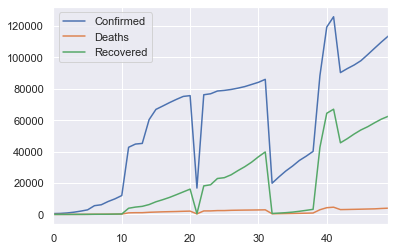

In [51]:
date_basis.plot(kind="line")

In [ ]:
# Lets visualize country wise

In [ ]:
# removinh longitude and latitude 

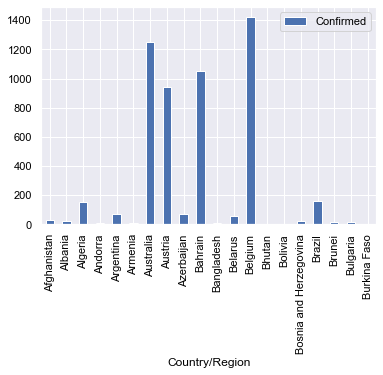

In [106]:
df.groupby("Country/Region")["Confirmed"].sum().to_frame(name="Confirmed").reset_index().head(20).plot.bar(x="Country/Region",y="Confirmed")

In [6]:
dfc=df.groupby("Country/Region")["Confirmed","Deaths","Recovered"].sum().reset_index()

In [7]:
dfd=df.groupby("Date")["Confirmed","Deaths","Recovered"].sum().reset_index()

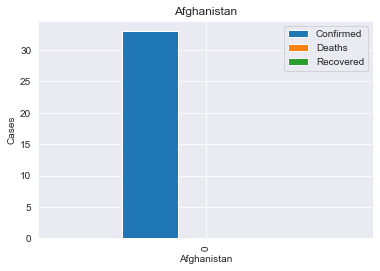

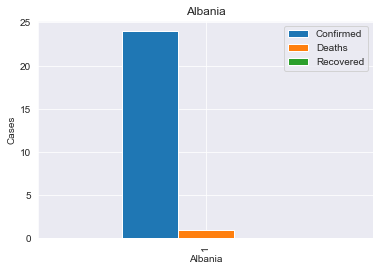

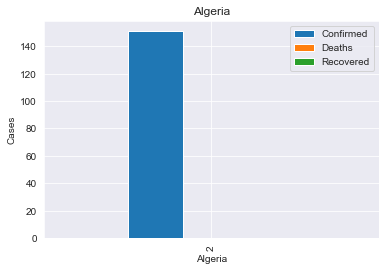

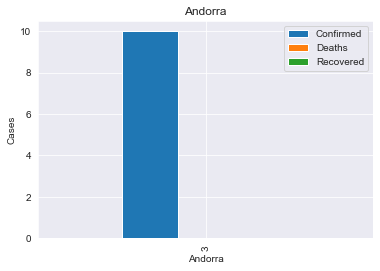

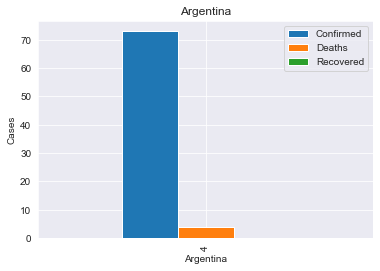

...

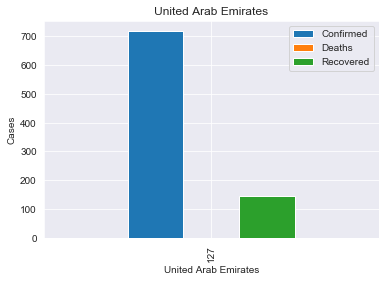

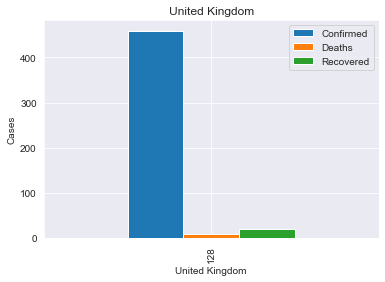

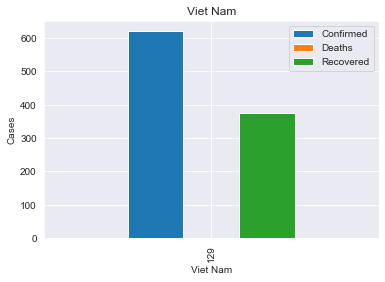

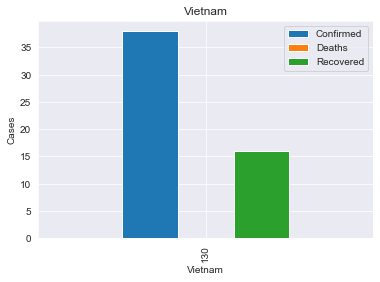

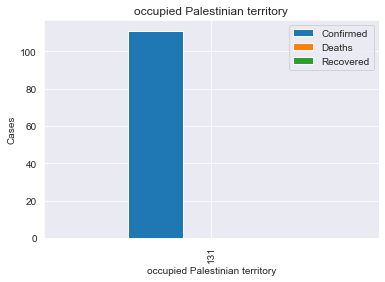

In [80]:
for country in dfc["Country/Region"].values:
    dfc[dfc["Country/Region"]== country].plot(kind="bar")
    plt.xlabel(country)
    plt.ylabel("Cases")
    plt.title(country)

In [ ]:
# by looking at the above graphs we can analyze cases country basis

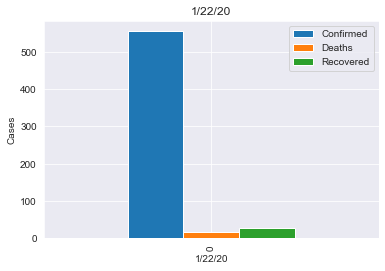

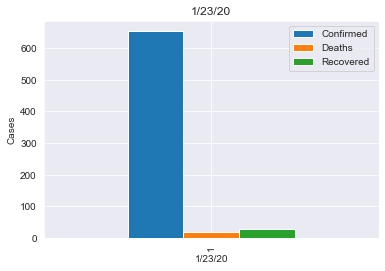

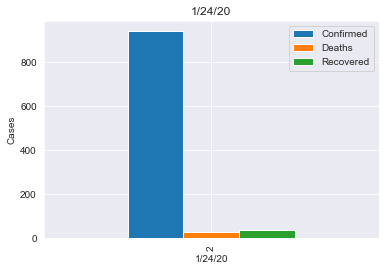

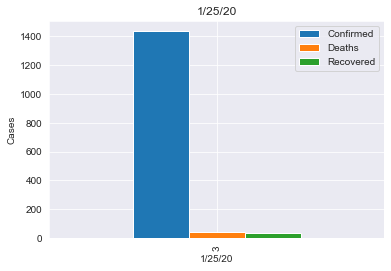

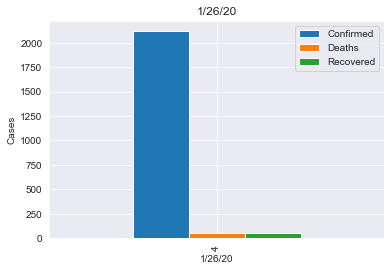

...

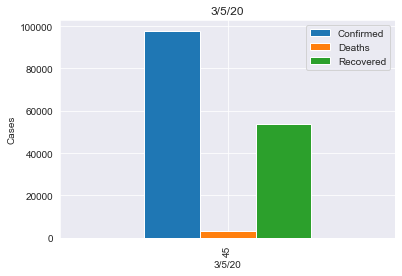

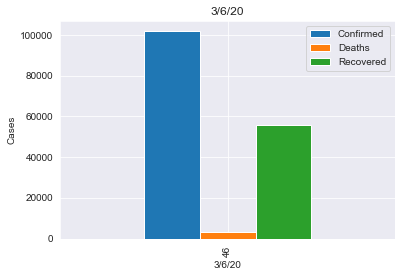

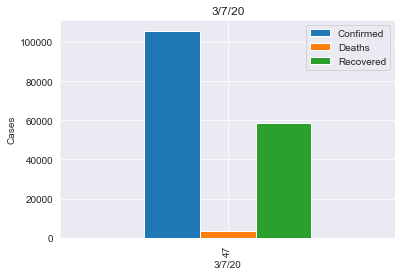

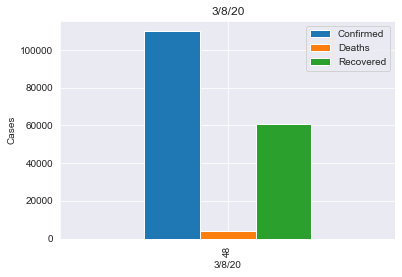

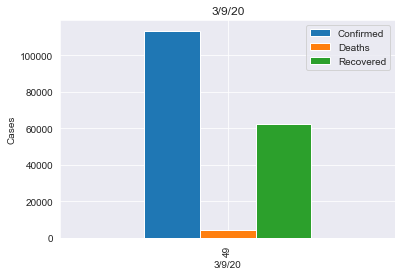

In [83]:
for date in dfd["Date"].values:
    dfd[dfd["Date"]== date].plot(kind="bar")
    plt.xlabel(date)
    plt.ylabel("Cases")
    plt.title(date)

In [ ]:
# As the date passes we can see increase in number of cases 

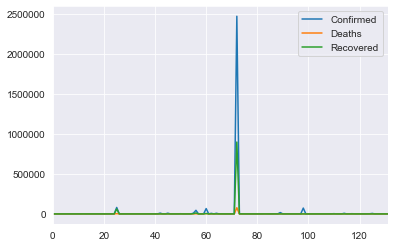

In [84]:
dfc.plot(kind="line")

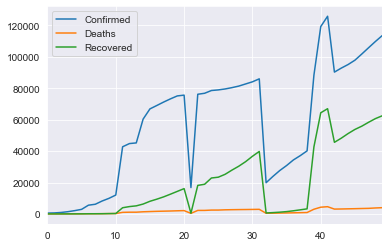

In [85]:
dfd.plot(kind="line")

In [ ]:
# creating a new col of active cases

In [13]:
dfd["Active"]=dfd["Confirmed"]-dfd["Deaths"] - dfd["Recovered"]

In [17]:
dfc["Active"]=dfc["Confirmed"]-dfc["Deaths"] - dfc["Recovered"]

In [8]:
df["Active"]=df["Confirmed"]-df["Deaths"] - df["Recovered"]

In [ ]:
# Lets look at the dataframe as per country

In [19]:
dfc.style.background_gradient(cmap='Set3')

,Country/Region,Confirmed,Deaths,Recovered,Active
0,Afghanistan,33,0,0,33
1,Albania,24,1,0,23
2,Algeria,151,0,0,151
3,Andorra,10,0,0,10
4,Argentina,73,4,0,69
5,Armenia,11,0,0,11
6,Australia,1252,23,390,839
7,Austria,939,0,10,929
8,Azerbaijan,73,0,3,70
9,Bahrain,1049,0,83,966


In [ ]:
# Lets look at the dataframm as per date

In [20]:
dfd.style.background_gradient(cmap='Pastel1')

,Date,Confirmed,Deaths,Recovered,Active
0,1/22/20,555,17,28,510
1,1/23/20,653,18,30,605
2,1/24/20,941,26,36,879
3,1/25/20,1434,42,39,1353
4,1/26/20,2118,56,52,2010
5,1/27/20,2927,82,61,2784
6,1/28/20,5578,131,107,5340
7,1/29/20,6166,133,126,5907
8,1/30/20,8234,171,143,7920
9,1/31/20,9927,213,222,9492


In [ ]:
# Lets sort countries with most number of deaths reported

In [33]:
dfc.sort_values(by="Deaths",ascending=False).head(5).style.background_gradient(cmap='Dark2')

,Country/Region,Confirmed,Deaths,Recovered,Active
72,Mainland China,2.47354e+06,77455,899639,1.49645e+06
60,Italy,66824,3239,5454,58131
25,China,80921,3161,61644,16116
56,Iran (Islamic Republic of),45206,1558,12183,31465
98,Republic of Korea,73069,469,1208,71392


In [ ]:
#  Lets sort and find out which country is infected most 

In [32]:
dfc.sort_values(by="Confirmed",ascending=False).head(5).style.background_gradient(cmap="gist_stern")

,Country/Region,Confirmed,Deaths,Recovered,Active
72,Mainland China,2.47354e+06,77455,899639,1.49645e+06
25,China,80921,3161,61644,16116
98,Republic of Korea,73069,469,1208,71392
60,Italy,66824,3239,5454,58131
56,Iran (Islamic Republic of),45206,1558,12183,31465


In [ ]:
# Lets see if a country has positive cases and out of them no recovery or death reported

In [45]:
dfc[dfc["Confirmed"]==dfc["Active"]].sort_values(by="Active",ascending=False).head(5).style.background_gradient(cmap="gist_rainbow")

,Country/Region,Confirmed,Deaths,Recovered,Active
97,Qatar,365,0,0,365
96,Portugal,210,0,0,210
33,Czech Republic,171,0,0,171
16,Brazil,159,0,0,159
2,Algeria,151,0,0,151


In [ ]:
# Lets find if there are any countries with all reported cases turns in Death of subject

In [42]:
dfc[dfc["Confirmed"]==dfc["Deaths"]]

,Country/Region,Confirmed,Deaths,Recovered,Active


In [ ]:
# Inference:This is a good news that people are recovering out of positive cases

In [ ]:
# Lets see if there is any country where all reported cases are recovered

In [46]:
dfc[dfc["Confirmed"]==dfc["Recovered"]]

,Country/Region,Confirmed,Deaths,Recovered,Active


In [ ]:
# Inference: This should bring attention of govt towards taking more precautions towards positive cases,to save lives 

In [ ]:
# Lets see if there is any country which has fully recovered from this virus

In [47]:
dfc[dfc["Active"]==0]

,Country/Region,Confirmed,Deaths,Recovered,Active


In [ ]:
# Plotting new cases

In [63]:
taba=df.groupby(['Country/Region', 'Date', ])['Confirmed', 'Deaths', 'Recovered']

In [65]:
taba=taba.sum().diff().reset_index()

In [71]:
tabam=taba['Country/Region'] != taba['Country/Region'].shift(1)

In [73]:
taba.loc[tabam, 'Confirmed'] = np.nan
taba.loc[tabam, 'Deaths'] = np.nan
taba.loc[tabam, 'Recovered'] = np.nan

In [77]:
fig = px.bar(taba, x="Date", y="Confirmed", color='Country/Region',title='New cases')
fig.show()

In [80]:
fig = px.bar(dfc.sort_values('Confirmed', ascending=False).head(20).sort_values('Confirmed', ascending=True), 
             x="Confirmed", y="Country/Region", title='Confirmed Cases', text='Confirmed', orientation='h', 
             width=700, height=700, range_x = [0, max(dfc['Confirmed'])+10000])
fig.update_traces(marker_color='#46cdcf', opacity=0.8, textposition='outside')
fig.show()

In [85]:
spread = df[df['Confirmed']!=0].groupby('Date')['Country/Region'].unique().apply(len)
spread = pd.DataFrame(spread).reset_index()

fig = px.line(spread, x='Date', y='Country/Region', text='Country/Region',
              title='Number of Countries/Regions to which COVID-19 spread over the time')
fig.update_traces(textposition='top center')
fig.show()

In [88]:
fig = px.bar(df.sort_values('Deaths', ascending=False).head(20).sort_values('Deaths', ascending=True), 
             x="Deaths", y="Country/Region", title='Deaths', text='Deaths', orientation='h', 
             width=700, height=700, range_x = [0, max(df['Deaths'])+500])
fig.update_traces(marker_color="darkseagreen", opacity=0.6, textposition='outside')
fig.show()

In [90]:
fig = px.bar(df.sort_values('Recovered', ascending=False).head(20).sort_values('Recovered', ascending=True), 
             x="Recovered", y="Country/Region", title='Recovered', text='Recovered', orientation='h', 
             width=700, height=700, range_x = [0, max(df['Recovered'])+10000])
fig.update_traces(marker_color="thistle", opacity=0.6, textposition='outside')
fig.show()

In [91]:
fig = px.scatter(df.sort_values('Deaths', ascending=False).iloc[:20, :], 
                 x='Confirmed', y='Deaths', color='Country/Region',
                 text='Country/Region', log_x=True, log_y=True, title='Deaths vs Confirmed')
fig.update_traces(textposition='top center')
fig.show()

In [5]:
fig = px.choropleth(df[df['Deaths']>0], 
                    locations="Country/Region", locationmode='country names',
                    color="Deaths", hover_name="Country/Region", 
                    range_color=[1,50], color_continuous_scale="agsunset",
                    title='Countries with Deaths Reported')
fig.update(layout_coloraxis_showscale=False)
fig.show()

In [6]:
formated_gdf = df.groupby(['Date', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered'].max()
formated_gdf = formated_gdf.reset_index()
formated_gdf['Date'] = pd.to_datetime(formated_gdf['Date'])
formated_gdf['Date'] = formated_gdf['Date'].dt.strftime('%m/%d/%Y')
formated_gdf['size'] = formated_gdf['Confirmed'].pow(0.3)

fig = px.scatter_geo(formated_gdf, locations="Country/Region", locationmode='country names', 
                     color="Confirmed", size='size', hover_name="Country/Region", 
                     range_color= [0, max(formated_gdf['Confirmed'])+2], 
                     projection="natural earth", animation_frame="Date", 
                     title='Spread over time')
fig.update(layout_coloraxis_showscale=False)
fig.show()

In [14]:
temp = df.groupby('Date')['Recovered', 'Deaths', 'Active'].sum().reset_index()
temp = temp.melt(id_vars="Date", value_vars=['Recovered', 'Deaths', 'Active'],
                 var_name='Case', value_name='Count')
temp.head()

fig = px.area(temp, x="Date", y="Count", color='Case',
             title='Cases over time', color_discrete_sequence = ["forestgreen"])
fig.show()